In [7]:
import json 
import numpy as np 
import os
import matplotlib.pyplot as plt
from birdseye.definitions import RUN_DIR
import birdseye.utils 
import pandas as pd
import seaborn as sns
from matplotlib.lines import Line2D

In [40]:
yearly = 180000 
monthly = yearly/12
print(monthly)

15000.0


In [41]:
monthly * .35

5250.0

In [43]:
.66 * monthly * .45

4455.0

In [15]:


def get_run_str(method, target_speed, sensor_speed, n_target, fading): 
    run_str = f"{method}_{target_speed}targetspeed_{sensor_speed}sensorspeed_{n_target}targets_{fading}fading"
    return run_str

def get_run_list(methods, target_speed, sensor_speed, n_target, fading): 
    return [get_run_str(method, target_speed, sensor_speed, n_target, fading) for method in methods]

def get_runs(methods, n_targets, fadings, sensor_speeds, target_speeds): 
    if type(n_targets) != list: 
        n_targets = [n_targets]
    if type(fadings) != list: 
        fadings = [fadings]
        
    run_lists = []
    for n in n_targets: 
        for f in fadings: 
            for ss in sensor_speeds: 
                for ts in target_speeds: 
                    run_lists.append(get_run_list(methods, ts, ss, n, f))
    return run_lists




In [65]:

def localization_count_less(runs):
    assert len(runs) == 9
    
    fig, axs = plt.subplots(3, 1, sharey='row', figsize=(6,9), dpi=200)

    
    
    ax = axs[0]
    i = 0
    labels = []
    for experiment_name in runs[2]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.localization_histogram(ax=ax, color=colors[i])
        i += 1
        labels.append(experiment_name)
    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 1 m/s, Target Speed = 1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)
    #plt.show()

    ##################
    
   
    ax = axs[1]
    i = 0
    labels = []
    for experiment_name in runs[5]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.localization_histogram(ax=ax, color=colors[i])
        i += 1
        labels.append(experiment_name)
    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 2 m/s, Target Speed = 1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)

    ################

    ax = axs[2]

    i = 0
    labels = []
    for experiment_name in runs[8]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.localization_histogram(ax=ax, color=colors[i])
        i += 1
        labels.append(experiment_name)
    ax.set_title("Sensor Speed = 3 m/s, Target Speed = 1 m/s")
    custom_lines = [Line2D([0], [0], color="blue", lw=4),
                    Line2D([0], [0], color="red", lw=4),
                    ]

    #ax.legend(custom_lines, labels)
    ax.legend(custom_lines, ["REPP","LAVAPilot [15]", "MCTS"],loc='upper center', bbox_to_anchor=(0.5, -0.3),
              fancybox=True, shadow=True, ncol=2)
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)


    fig.text(0.5, 0.08, 'Time (s)', ha='center', va='center')
    #fig.text(0.08, 0.5, 'Count', ha='center', va='center', rotation='vertical')

    plt.show()

In [59]:

def localization_count(runs):
    assert len(runs) == 9
    
    fig, axs = plt.subplots(3, 3, sharey='row', figsize=(15,12), dpi=200)

    #fig = plt.figure(figsize=(5,3))
    #ax = fig.subplots()
    ax = axs[0,0]
    facecolors = ["pink","lightblue","lightgreen"]
    colors = ["red", "blue", "green"]
    i = 0
    labels = []
    for experiment_name in runs[0]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.localization_histogram(ax=ax, color=colors[i])
        i += 1
        labels.append(experiment_name)

    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 1 m/s, Target Speed = 0.1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)
    #plt.show()

    #fig = plt.figure(figsize=(5,3))
    #ax = fig.subplots()
    ax = axs[0,1]
    i = 0
    labels = []
    for experiment_name in runs[1]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.localization_histogram(ax=ax, color=colors[i])
        i += 1
        labels.append(experiment_name)
    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 1 m/s, Target Speed = 0.5 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)
    #plt.show()

    #fig = plt.figure(figsize=(5,3))
    #ax = fig.subplots()
    ax = axs[0,2]
    i = 0
    labels = []
    for experiment_name in runs[2]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.localization_histogram(ax=ax, color=colors[i])
        i += 1
        labels.append(experiment_name)
    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 1 m/s, Target Speed = 1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)
    #plt.show()

    ##################
    ax = axs[1,0]

    i = 0
    labels = []
    for experiment_name in runs[3]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.localization_histogram(ax=ax, color=colors[i])
        i += 1
        labels.append(experiment_name)
    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 2 m/s, Target Speed = 0.1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)

    ax = axs[1,1]

    i = 0
    labels = []
    for experiment_name in runs[4]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.localization_histogram(ax=ax, color=colors[i])
        i += 1
        labels.append(experiment_name)
    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 2 m/s, Target Speed = 0.5 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)

    ax = axs[1,2]
    i = 0
    labels = []
    for experiment_name in runs[5]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.localization_histogram(ax=ax, color=colors[i])
        i += 1
        labels.append(experiment_name)
    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 2 m/s, Target Speed = 1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)

    ################

    ax = axs[2,0]

    i = 0
    labels = []
    for experiment_name in runs[6]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.localization_histogram(ax=ax, color=colors[i])
        i += 1
        labels.append(experiment_name)
    ax.set_title("Sensor Speed = 3 m/s, Target Speed = 0.1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)

    ax = axs[2,1]

    i = 0
    labels = []
    for experiment_name in runs[7]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.localization_histogram(ax=ax, color=colors[i])
        i += 1
        labels.append(experiment_name)
    ax.set_title("Sensor Speed = 3 m/s, Target Speed = 0.5 m/s")
    custom_lines = [Line2D([0], [0], color="blue", lw=4),
                    Line2D([0], [0], color="red", lw=4),
                    ]

    #ax.legend(custom_lines, labels)
    ax.legend(custom_lines, ["REPP","LAVAPilot [15]", "MCTS"],loc='upper center', bbox_to_anchor=(0.5, -0.3),
              fancybox=True, shadow=True, ncol=2)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)

    ax = axs[2,2]

    i = 0
    labels = []
    for experiment_name in runs[8]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.localization_histogram(ax=ax, color=colors[i])
        i += 1
        labels.append(experiment_name)
    ax.set_title("Sensor Speed = 3 m/s, Target Speed = 1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)


    fig.text(0.5, 0.08, 'Time (s)', ha='center', va='center')
    #fig.text(0.08, 0.5, 'Count', ha='center', va='center', rotation='vertical')

    plt.show()

In [75]:
def rmse_less(runs): 
    assert len(runs) == 9
    
    fig, axs = plt.subplots(3, 1, sharey='row', figsize=(6,9), dpi=200)

   
    
    ax = axs[0]
    i = 0
    labels = []
    for experiment_name in runs[2]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)
    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 1 m/s, Target Speed = 1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)
    #plt.show()

    ##################
   
  
    ax = axs[1]
    i = 0
    labels = []
    for experiment_name in runs[5]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)
    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 2 m/s, Target Speed = 1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)

    ################
  

    ax = axs[2]

    i = 0
    labels = []
    for experiment_name in runs[8]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)
    ax.set_title("Sensor Speed = 3 m/s, Target Speed = 1 m/s")
    custom_lines = [Line2D([0], [0], color="blue", lw=4),
                    Line2D([0], [0], color="red", lw=4),
                    ]

    #ax.legend(custom_lines, labels)
    ax.legend(custom_lines, ["REPP","LAVAPilot [15]", "MCTS"],loc='upper center', bbox_to_anchor=(0.5, -0.3),
              fancybox=True, shadow=True, ncol=2)
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    ax.tick_params(axis='x',labelsize=10)
    for label in ax.get_xticklabels()[::2]:
        label.set_visible(False)


    fig.text(0.5, 0.08, 'Time (s)', ha='center', va='center')
    fig.text(0.06, 0.5, 'RMSE (m)', ha='center', va='center', rotation='vertical')

    plt.show()

In [62]:
def rmse(runs): 
    assert len(runs) == 9
    
    fig, axs = plt.subplots(3, 3, sharey='row', figsize=(15,9), dpi=200)

    #fig = plt.figure(figsize=(5,3))
    #ax = fig.subplots()
    ax = axs[0,0]
    facecolors = ["pink","lightblue", "lightgreen"]
    colors = ["red", "blue", "green"]
    i = 0
    labels = []
    for experiment_name in runs[0]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)

    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 1 m/s, Target Speed = 0.1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)
    #plt.show()

    #fig = plt.figure(figsize=(5,3))
    #ax = fig.subplots()
    ax = axs[0,1]
    i = 0
    labels = []
    for experiment_name in runs[1]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)
    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 1 m/s, Target Speed = 0.5 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)
    #plt.show()

    #fig = plt.figure(figsize=(5,3))
    #ax = fig.subplots()
    ax = axs[0,2]
    i = 0
    labels = []
    for experiment_name in runs[2]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)
    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 1 m/s, Target Speed = 1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)
    #plt.show()

    ##################
    ax = axs[1,0]

    i = 0
    labels = []
    for experiment_name in runs[3]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)
    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 2 m/s, Target Speed = 0.1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)

    ax = axs[1,1]

    i = 0
    labels = []
    for experiment_name in runs[4]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)
    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 2 m/s, Target Speed = 0.5 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)

    ax = axs[1,2]
    i = 0
    labels = []
    for experiment_name in runs[5]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)
    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 2 m/s, Target Speed = 1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)

    ################

    ax = axs[2,0]

    i = 0
    labels = []
    for experiment_name in runs[6]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)
    ax.set_title("Sensor Speed = 3 m/s, Target Speed = 0.1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    ax.tick_params(axis='x',labelsize=10)
    for label in ax.get_xticklabels()[::2]:
        label.set_visible(False)

    ax = axs[2,1]

    i = 0
    labels = []
    for experiment_name in runs[7]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)
    ax.set_title("Sensor Speed = 3 m/s, Target Speed = 0.5 m/s")
    custom_lines = [Line2D([0], [0], color="blue", lw=4),
                    Line2D([0], [0], color="red", lw=4),
                    ]

    #ax.legend(custom_lines, labels)
    ax.legend(custom_lines, ["REPP","LAVAPilot [15]", "MCTS"],loc='upper center', bbox_to_anchor=(0.5, -0.3),
              fancybox=True, shadow=True, ncol=2)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    ax.tick_params(axis='x',labelsize=10)
    for label in ax.get_xticklabels()[::2]:
        label.set_visible(False)

    ax = axs[2,2]

    i = 0
    labels = []
    for experiment_name in runs[8]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)
    ax.set_title("Sensor Speed = 3 m/s, Target Speed = 1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    ax.tick_params(axis='x',labelsize=10)
    for label in ax.get_xticklabels()[::2]:
        label.set_visible(False)


    fig.text(0.5, 0.08, 'Time (s)', ha='center', va='center')
    fig.text(0.08, 0.5, 'RMSE (m)', ha='center', va='center', rotation='vertical')

    plt.show()

In [74]:
def std_dev_less(runs): 
    assert len(runs) == 9 
    
    fig, axs = plt.subplots(3, 1, sharey='row', figsize=(6,9), dpi=200)

   
    ax = axs[0]
    i = 0
    labels = []
    for experiment_name in runs[2]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)
    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 1 m/s, Target Speed = 1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)
    #plt.show()

    ##################
    
    ax = axs[1]
    i = 0
    labels = []
    for experiment_name in runs[5]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)
    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 2 m/s, Target Speed = 1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)

    ################

   
    ax = axs[2]

    i = 0
    labels = []
    for experiment_name in runs[8]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)
    ax.set_title("Sensor Speed = 3 m/s, Target Speed = 1 m/s")
    custom_lines = [Line2D([0], [0], color="blue", lw=4),
                    Line2D([0], [0], color="red", lw=4),
                    ]

    #ax.legend(custom_lines, labels)
    ax.legend(custom_lines, ["REPP","LAVAPilot [15]", "MCTS"],loc='upper center', bbox_to_anchor=(0.5, -0.3),
              fancybox=True, shadow=True, ncol=2)
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    ax.tick_params(axis='x',labelsize=10)
    for label in ax.get_xticklabels()[::2]:
        label.set_visible(False)


    fig.text(0.5, 0.08, 'Time (s)', ha='center', va='center')
    fig.text(0.06, 0.5, 'Standard Deviation (m)', ha='center', va='center', rotation='vertical')
    plt.show()

In [73]:
def std_dev(runs): 
    assert len(runs) == 9 
    
    fig, axs = plt.subplots(3, 3, sharey='row', figsize=(15,9), dpi=200)

    #fig = plt.figure(figsize=(5,3))
    #ax = fig.subplots()
    ax = axs[0,0]
    facecolors = ["pink","lightblue", "lightgreen"]
    colors = ["red", "blue", "green"]
    i = 0
    labels = []
    for experiment_name in runs[0]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)

    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 1 m/s, Target Speed = 0.1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)
    #plt.show()

    #fig = plt.figure(figsize=(5,3))
    #ax = fig.subplots()
    ax = axs[0,1]
    i = 0
    labels = []
    for experiment_name in runs[1]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)
    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 1 m/s, Target Speed = 0.5 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)
    #plt.show()

    #fig = plt.figure(figsize=(5,3))
    #ax = fig.subplots()
    ax = axs[0,2]
    i = 0
    labels = []
    for experiment_name in runs[2]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)
    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 1 m/s, Target Speed = 1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)
    #plt.show()

    ##################
    ax = axs[1,0]

    i = 0
    labels = []
    for experiment_name in runs[3]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)
    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 2 m/s, Target Speed = 0.1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)

    ax = axs[1,1]

    i = 0
    labels = []
    for experiment_name in runs[4]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)
    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 2 m/s, Target Speed = 0.5 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)

    ax = axs[1,2]
    i = 0
    labels = []
    for experiment_name in runs[5]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)
    ax.xaxis.set_ticklabels([])
    ax.set_title("Sensor Speed = 2 m/s, Target Speed = 1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    # ax.tick_params(axis='x',labelsize=10)
    # for label in ax.get_xticklabels()[::2]:
    #     label.set_visible(False)

    ################

    ax = axs[2,0]

    i = 0
    labels = []
    for experiment_name in runs[6]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)
    ax.set_title("Sensor Speed = 3 m/s, Target Speed = 0.1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    ax.tick_params(axis='x',labelsize=10)
    for label in ax.get_xticklabels()[::2]:
        label.set_visible(False)

    ax = axs[2,1]

    i = 0
    labels = []
    for experiment_name in runs[7]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)
    ax.set_title("Sensor Speed = 3 m/s, Target Speed = 0.5 m/s")
    custom_lines = [Line2D([0], [0], color="blue", lw=4),
                    Line2D([0], [0], color="red", lw=4),
                    ]

    #ax.legend(custom_lines, labels)
    ax.legend(custom_lines, ["REPP","LAVAPilot [15]", "MCTS"],loc='upper center', bbox_to_anchor=(0.5, -0.3),
              fancybox=True, shadow=True, ncol=2)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    ax.tick_params(axis='x',labelsize=10)
    for label in ax.get_xticklabels()[::2]:
        label.set_visible(False)

    ax = axs[2,2]

    i = 0
    labels = []
    for experiment_name in runs[8]:
        reader = birdseye.utils.ResultsReader(experiment_name)
        reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
        i += 1
        labels.append(experiment_name)
    ax.set_title("Sensor Speed = 3 m/s, Target Speed = 1 m/s")
    # custom_lines = [Line2D([0], [0], color="blue", lw=4),
    #                 Line2D([0], [0], color="red", lw=4),
    #                 ]

    # ax.legend(custom_lines, labels)
    # ax.set_xlabel("Time")
    # ax.set_ylabel("RMSE")
    ax.tick_params(axis='x',labelsize=10)
    for label in ax.get_xticklabels()[::2]:
        label.set_visible(False)


    fig.text(0.5, 0.08, 'Time (s)', ha='center', va='center')
    fig.text(0.08, 0.5, 'Standard Deviation (m)', ha='center', va='center', rotation='vertical')
    plt.show()

4 targets, 5 fading


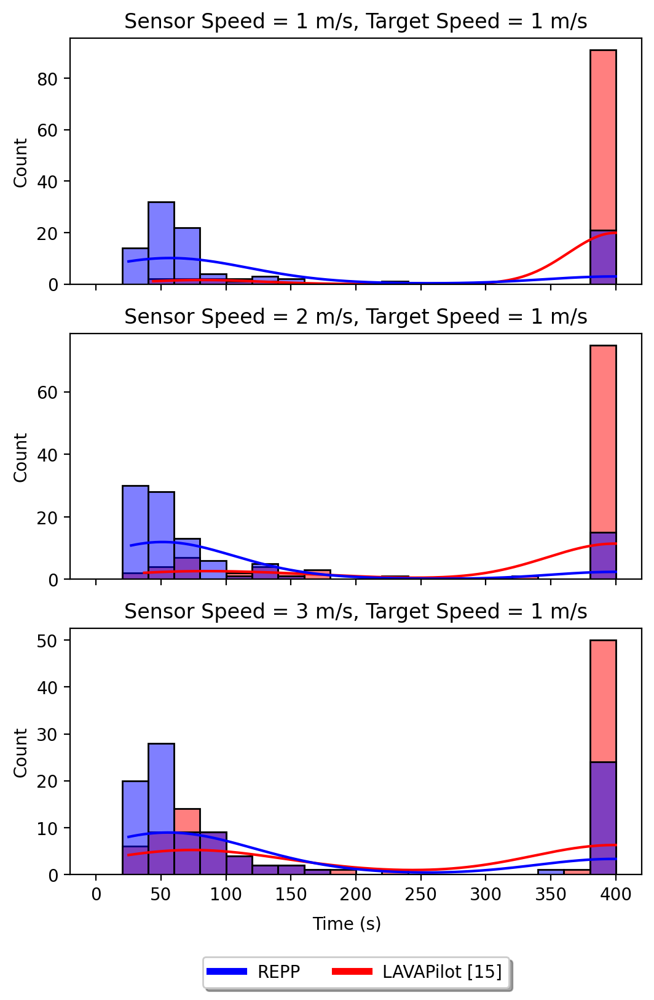

8 targets, 5 fading


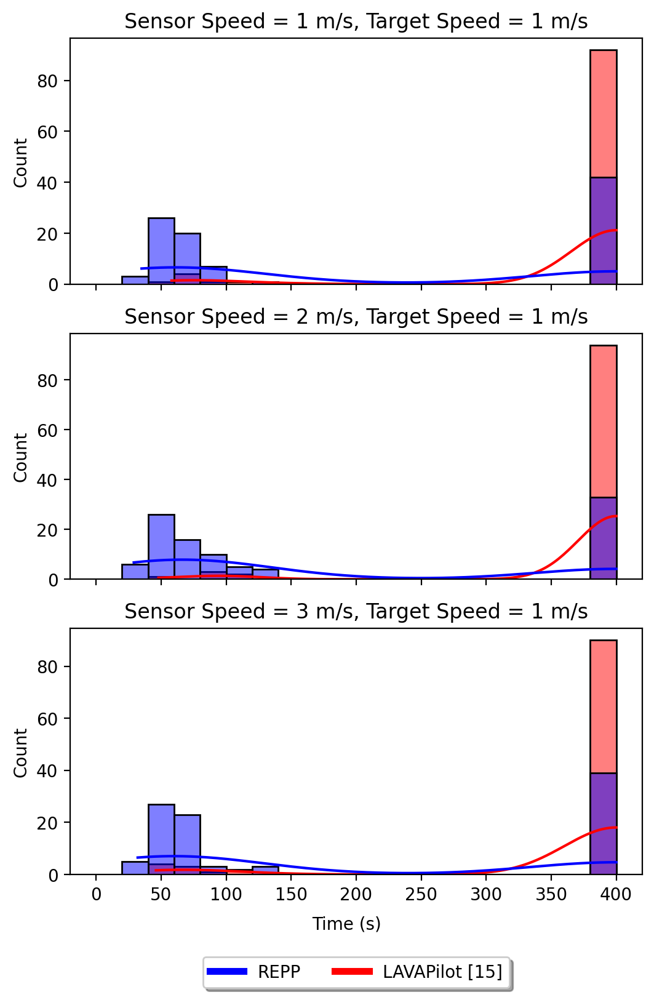

4 targets, 10 fading


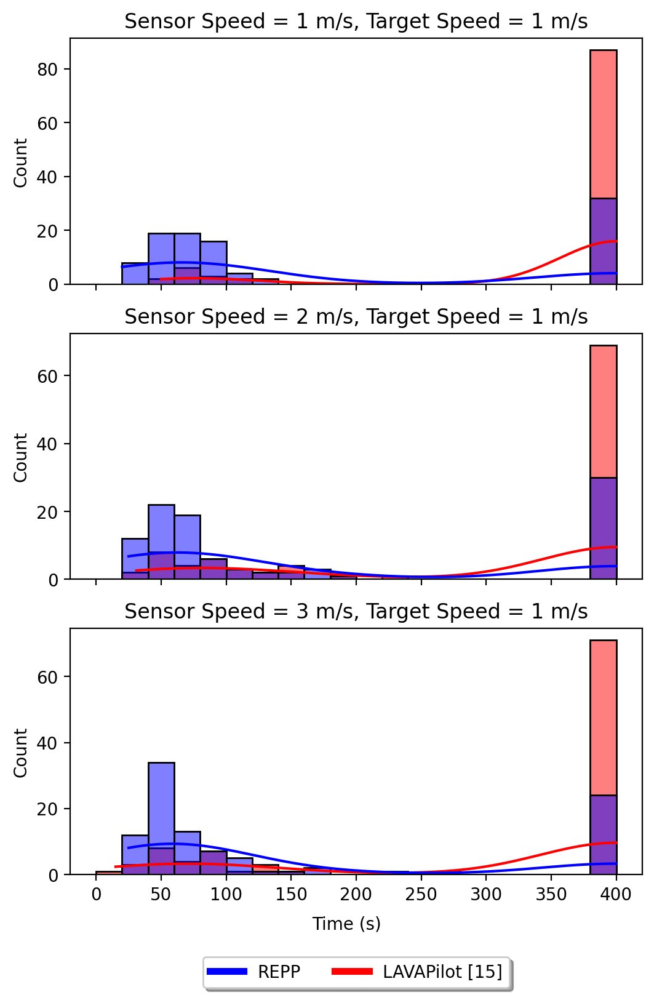

8 targets, 10 fading


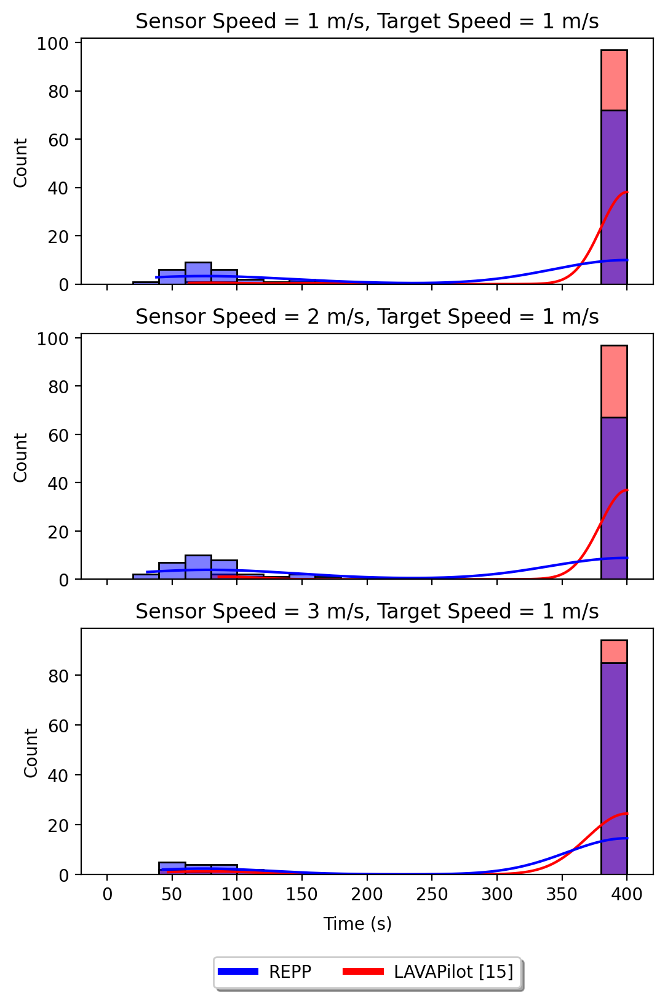

In [68]:
methods = ["lavapilot","repp"]
target_speeds = [0.1,0.5,1]
sensor_speeds = [1,2,3]
n_targets = [4,8]
fadings = [5,10]

print("4 targets, 5 fading")
localization_count_less(get_runs(methods, 4, 5, sensor_speeds, target_speeds))
print("8 targets, 5 fading")
localization_count_less(get_runs(methods, 8, 5, sensor_speeds, target_speeds))
print("4 targets, 10 fading")
localization_count_less(get_runs(methods, 4, 10, sensor_speeds, target_speeds))
print("8 targets, 10 fading")
localization_count_less(get_runs(methods, 8, 10, sensor_speeds, target_speeds))

4 targets, 5 fading


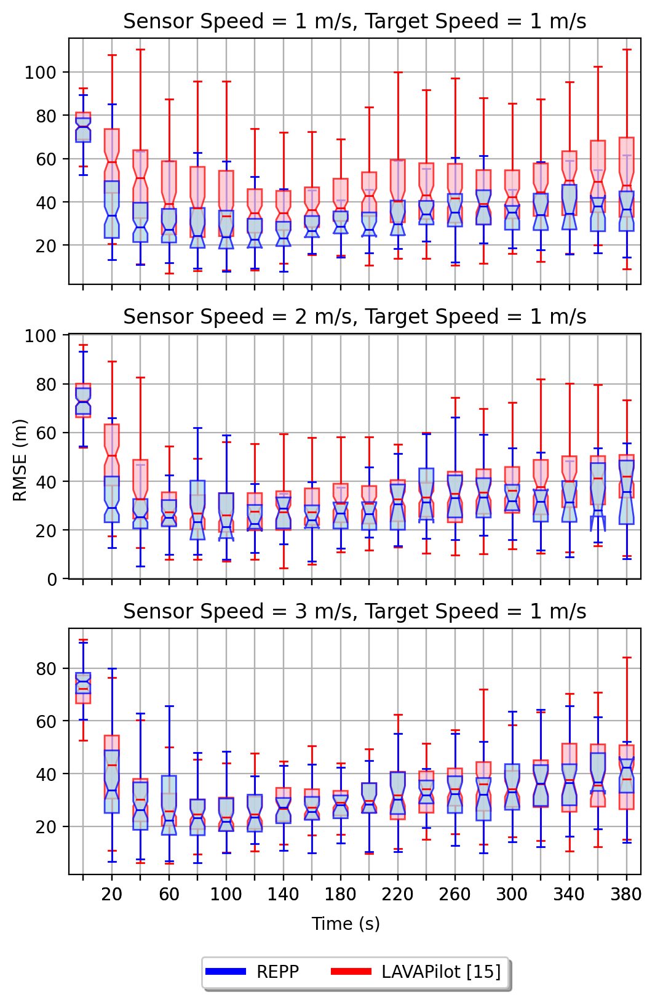

8 targets, 5 fading


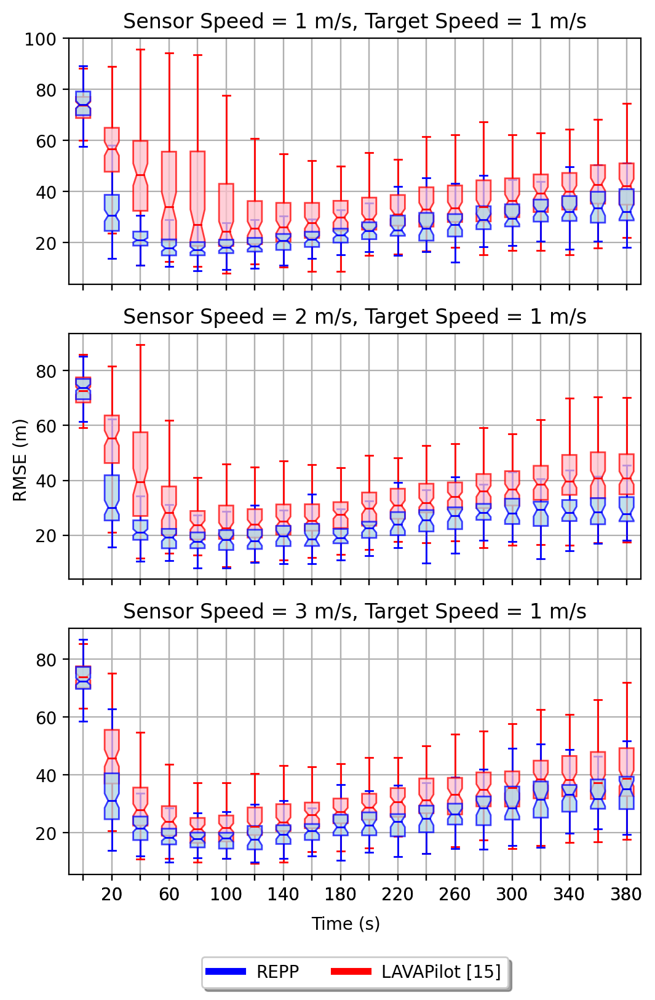

4 targets, 10 fading


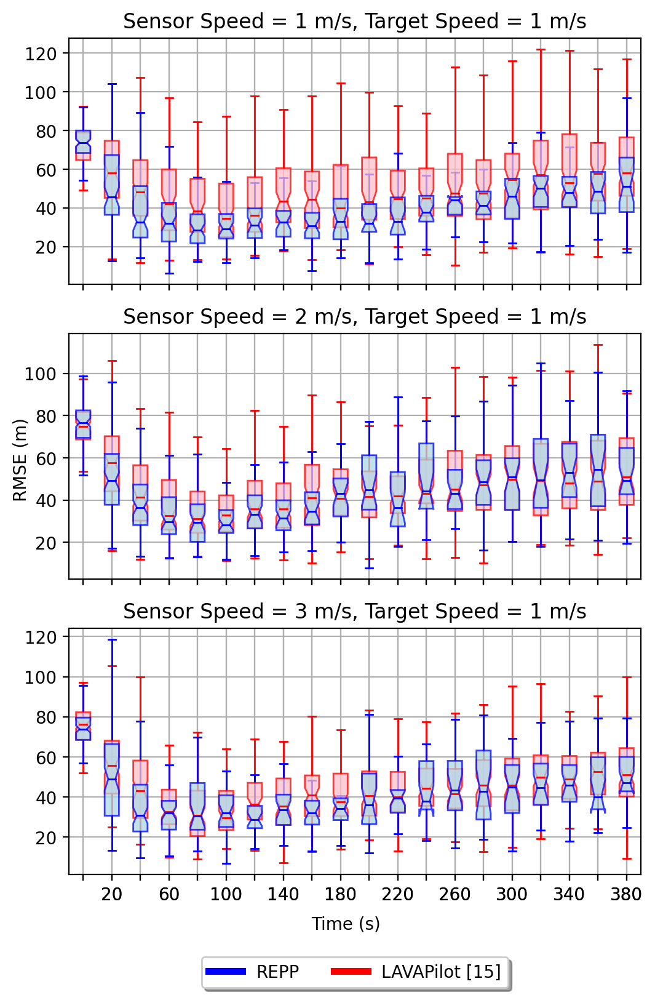

8 targets, 10 fading


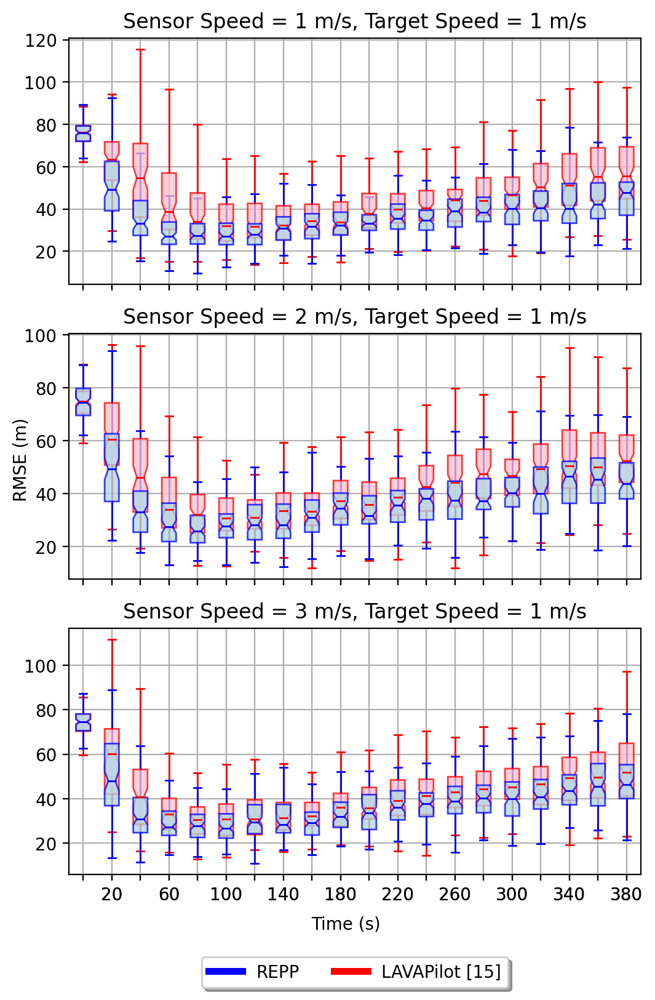

In [76]:
print("4 targets, 5 fading")
rmse_less(get_runs(methods, 4, 5, sensor_speeds, target_speeds))
print("8 targets, 5 fading")
rmse_less(get_runs(methods, 8, 5, sensor_speeds, target_speeds))
print("4 targets, 10 fading")
rmse_less(get_runs(methods, 4, 10, sensor_speeds, target_speeds))
print("8 targets, 10 fading")
rmse_less(get_runs(methods, 8, 10, sensor_speeds, target_speeds))

4 targets, 5 fading


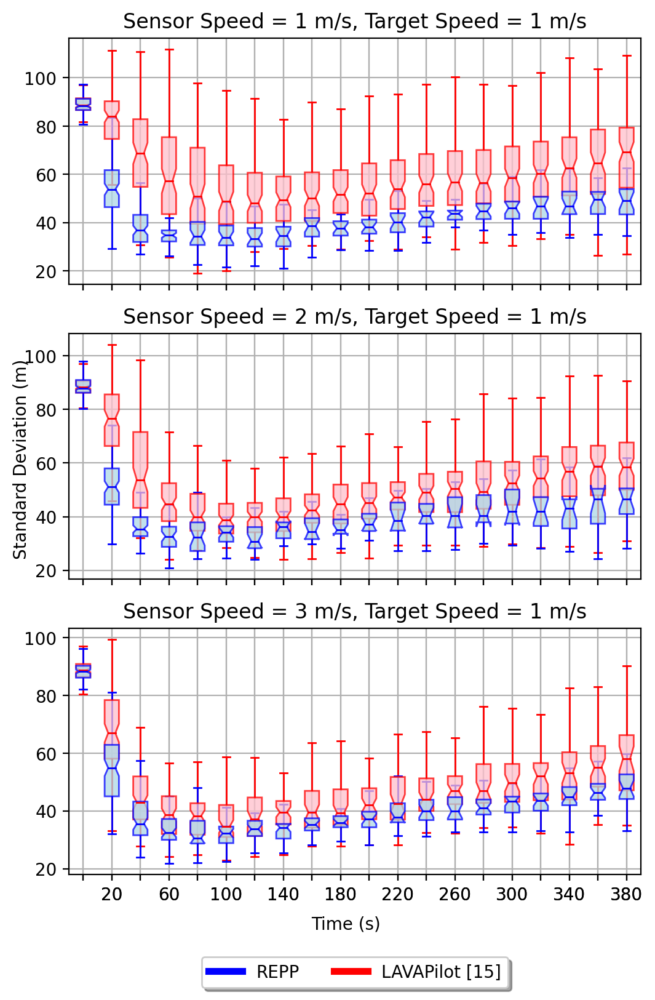

8 targets, 5 fading


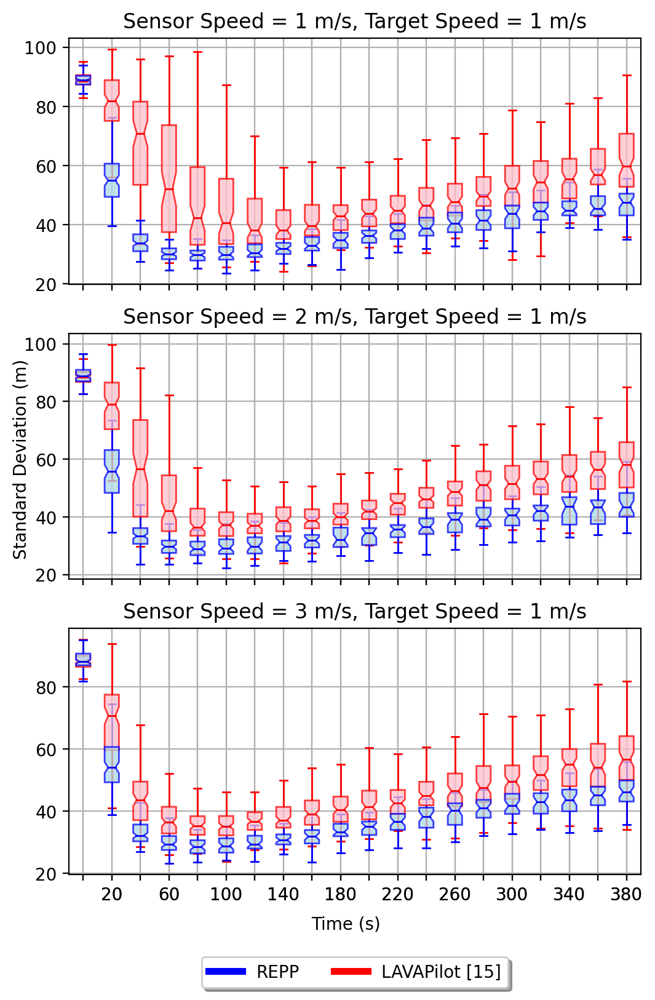

4 targets, 10 fading


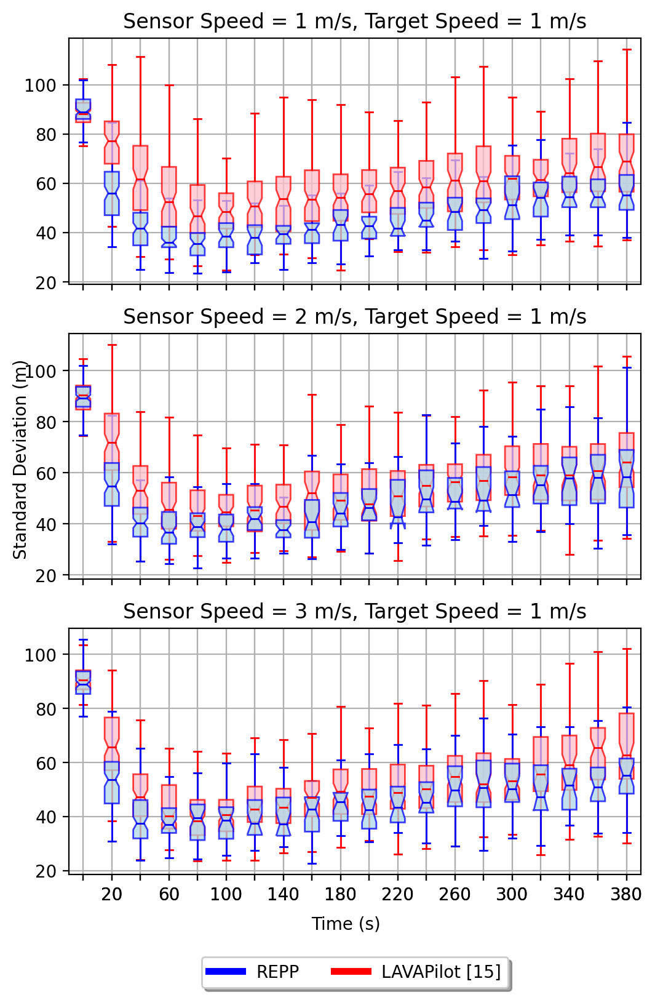

8 targets, 10 fading


In [ ]:
print("4 targets, 5 fading")
std_dev_less(get_runs(methods, 4, 5, sensor_speeds, target_speeds))
print("8 targets, 5 fading")
std_dev_less(get_runs(methods, 8, 5, sensor_speeds, target_speeds))
print("4 targets, 10 fading")
std_dev_less(get_runs(methods, 4, 10, sensor_speeds, target_speeds))
print("8 targets, 10 fading")
std_dev_less(get_runs(methods, 8, 10, sensor_speeds, target_speeds))

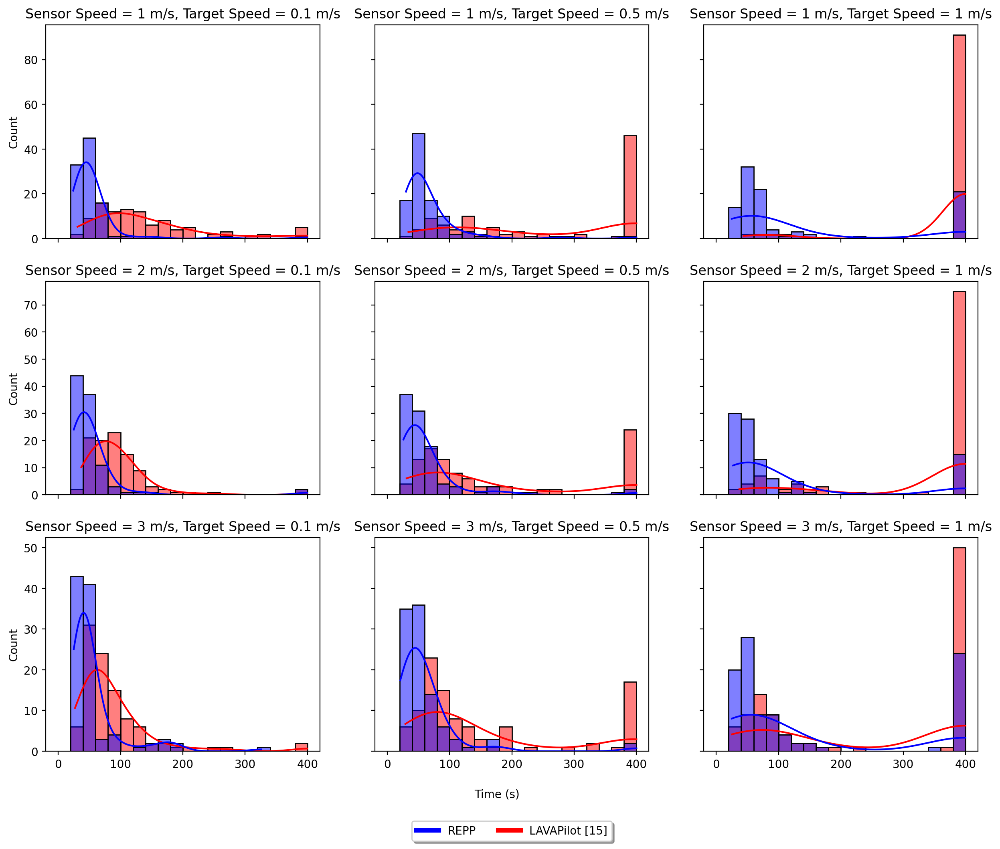

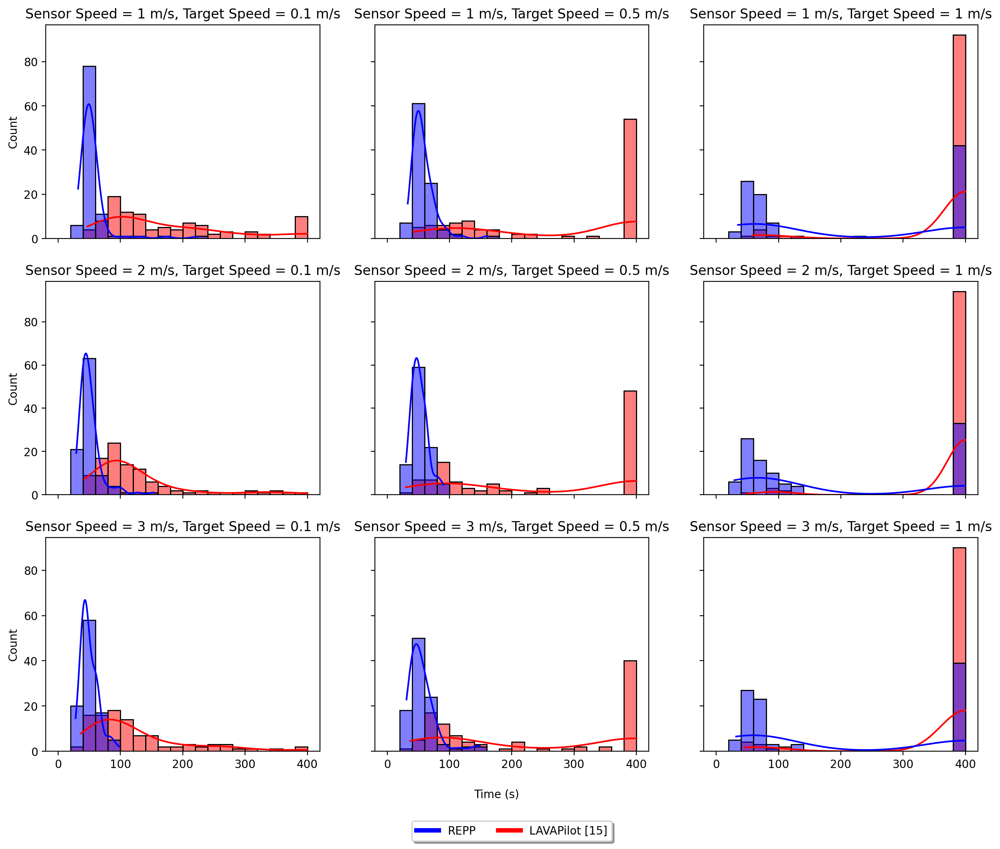

In [60]:
methods = ["lavapilot","repp"]
target_speeds = [0.1,0.5,1]
sensor_speeds = [1,2,3]
n_targets = [4,8]
fadings = [5,10]

localization_count(get_runs(methods, 4, 5, sensor_speeds, target_speeds))
localization_count(get_runs(methods, 8, 5, sensor_speeds, target_speeds))

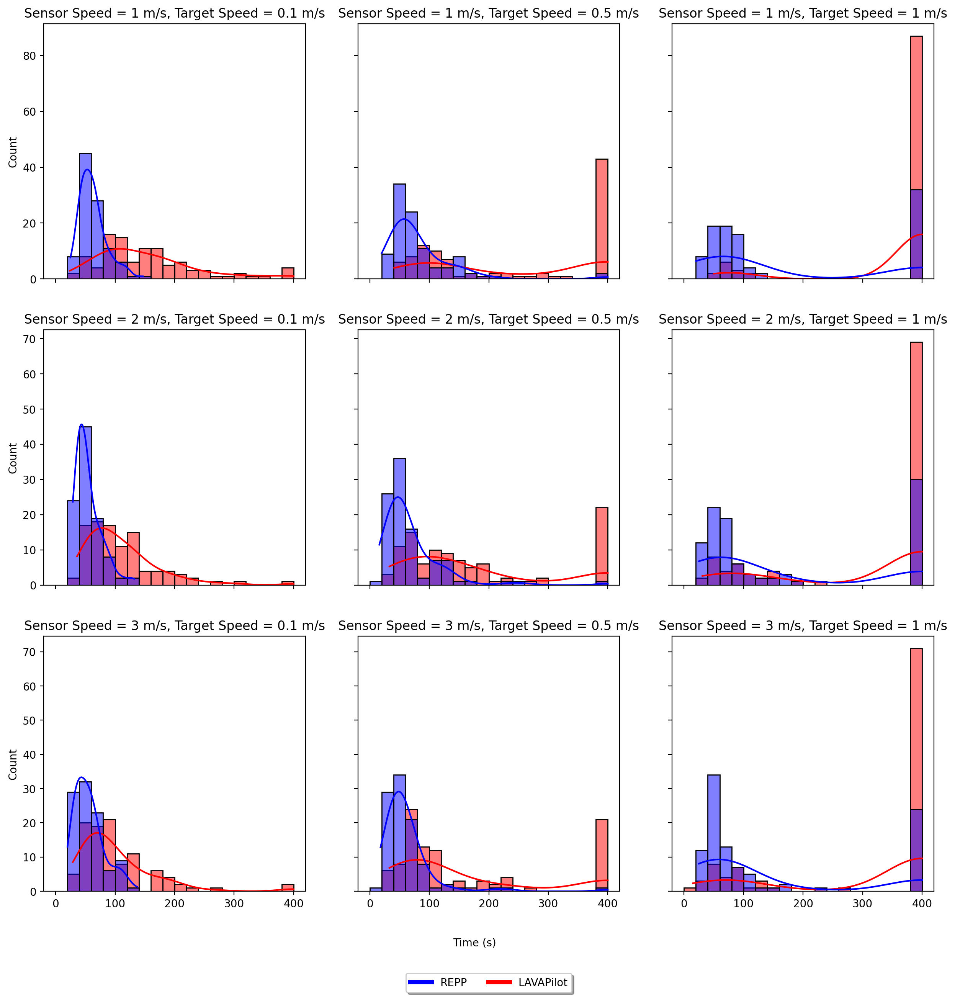

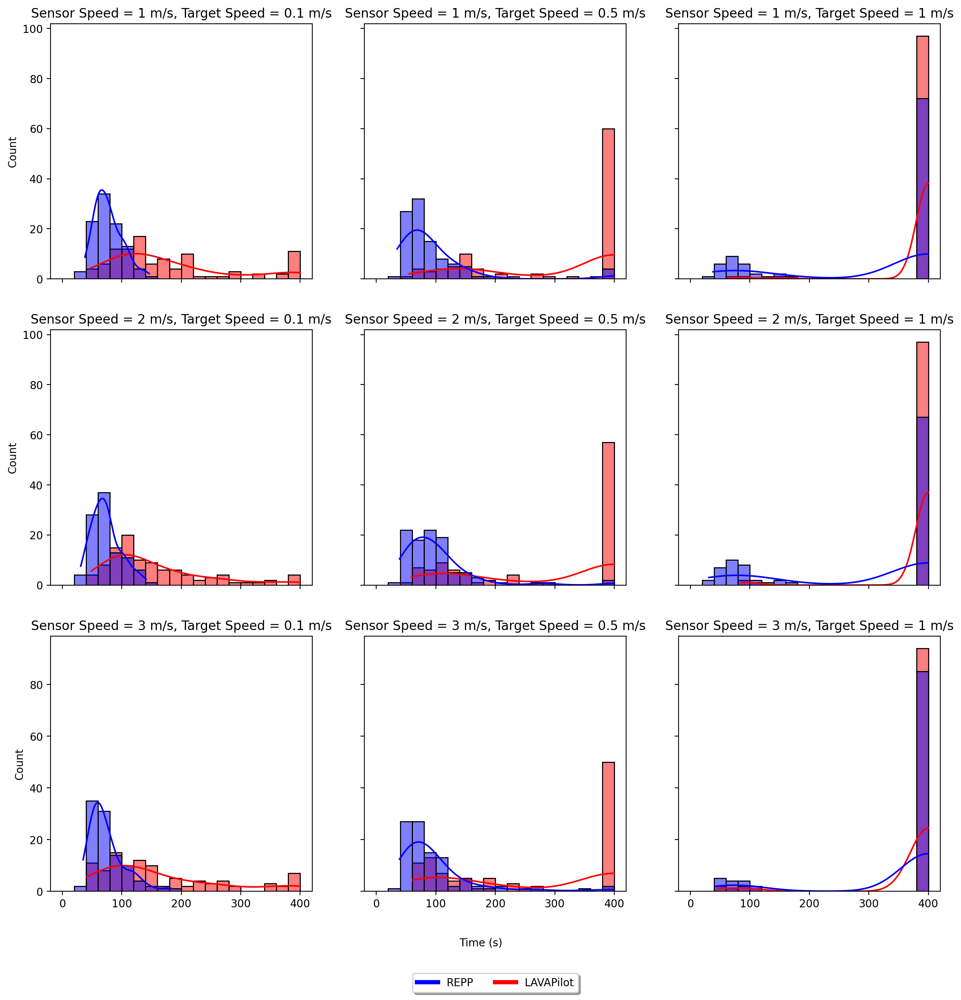

In [20]:
localization_count(get_runs(methods, 4, 10, sensor_speeds, target_speeds))
localization_count(get_runs(methods, 8, 10, sensor_speeds, target_speeds))

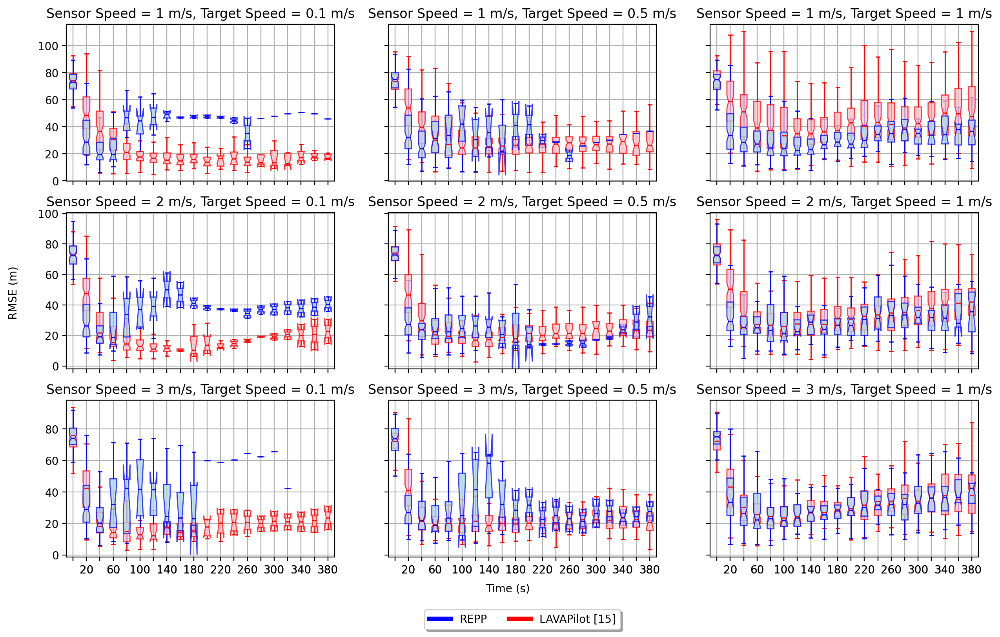

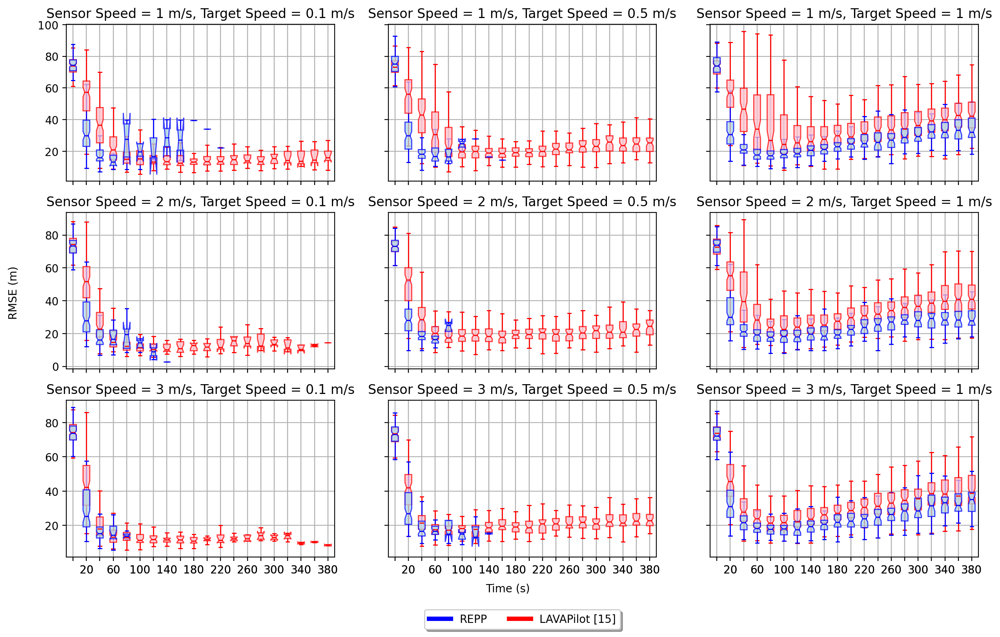

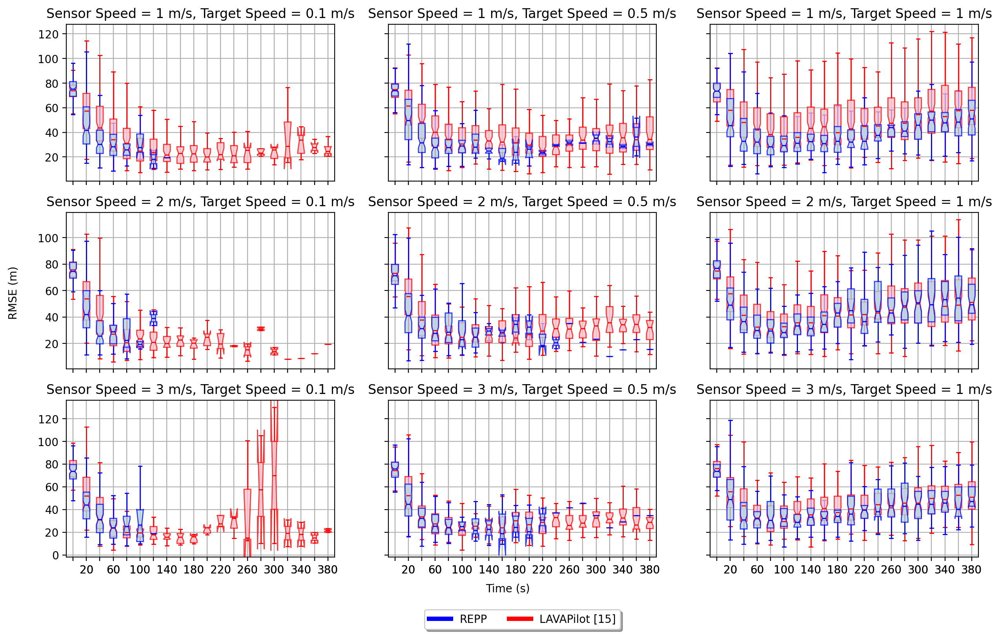

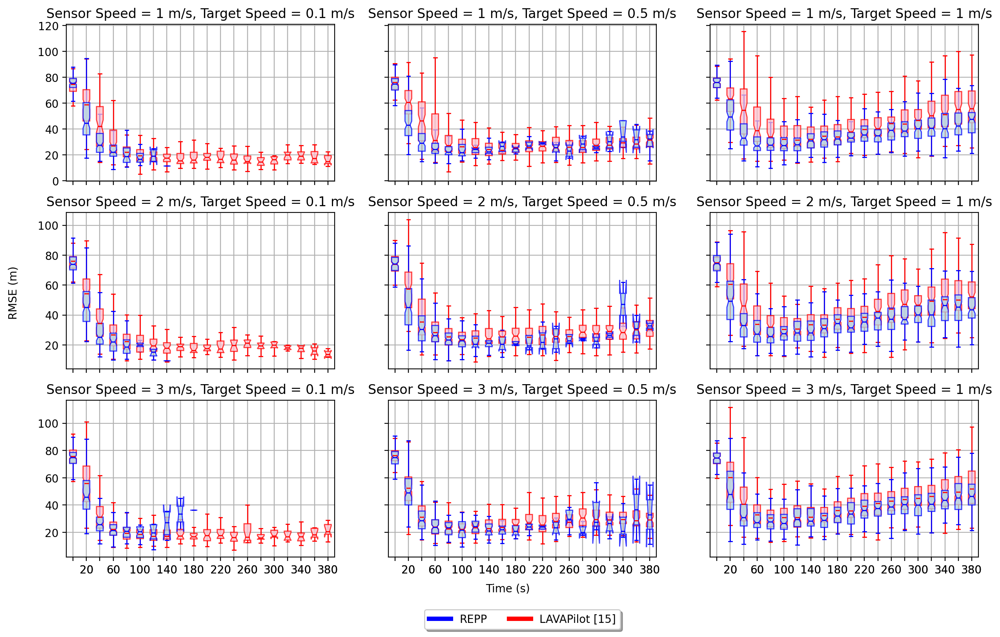

In [63]:
rmse(get_runs(methods, 4, 5, sensor_speeds, target_speeds))
rmse(get_runs(methods, 8, 5, sensor_speeds, target_speeds))
rmse(get_runs(methods, 4, 10, sensor_speeds, target_speeds))
rmse(get_runs(methods, 8, 10, sensor_speeds, target_speeds))

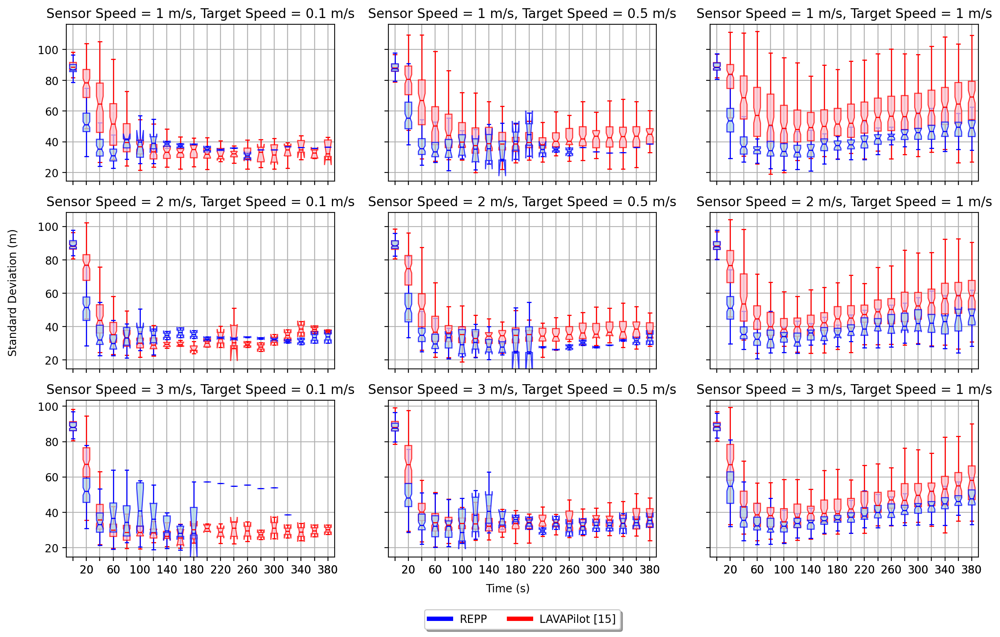

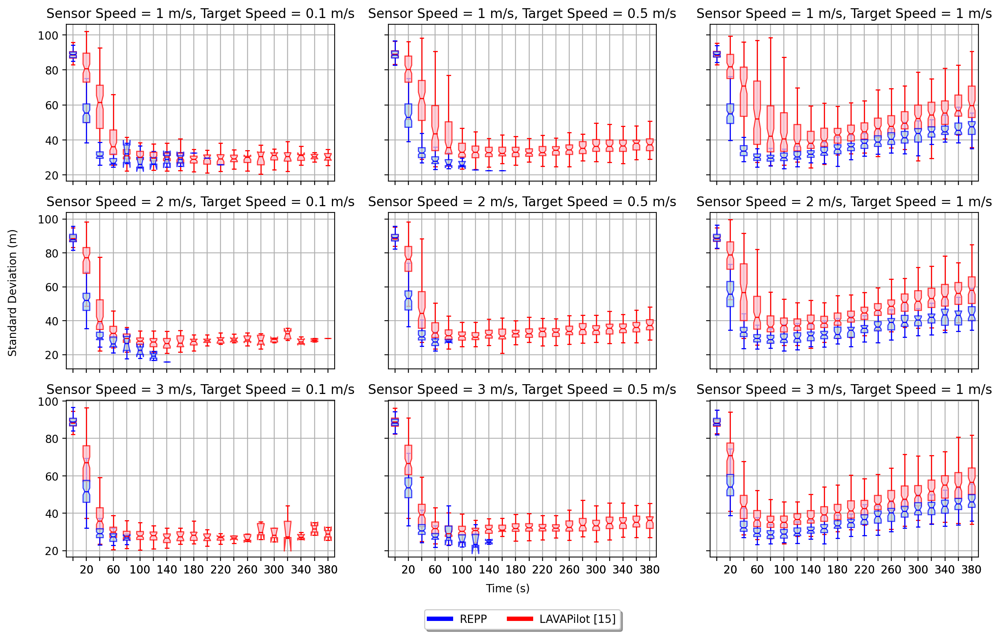

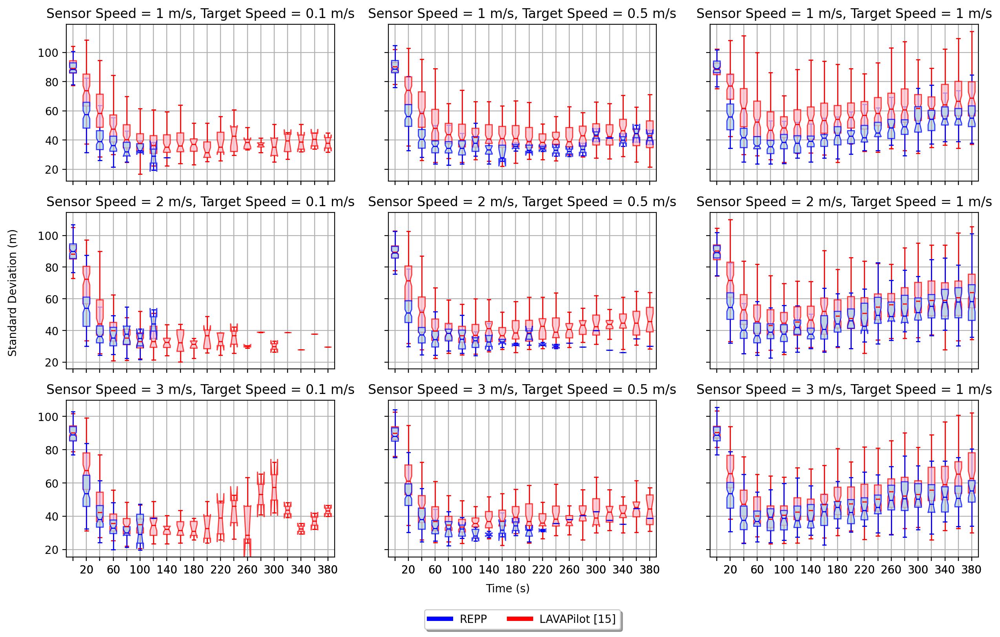

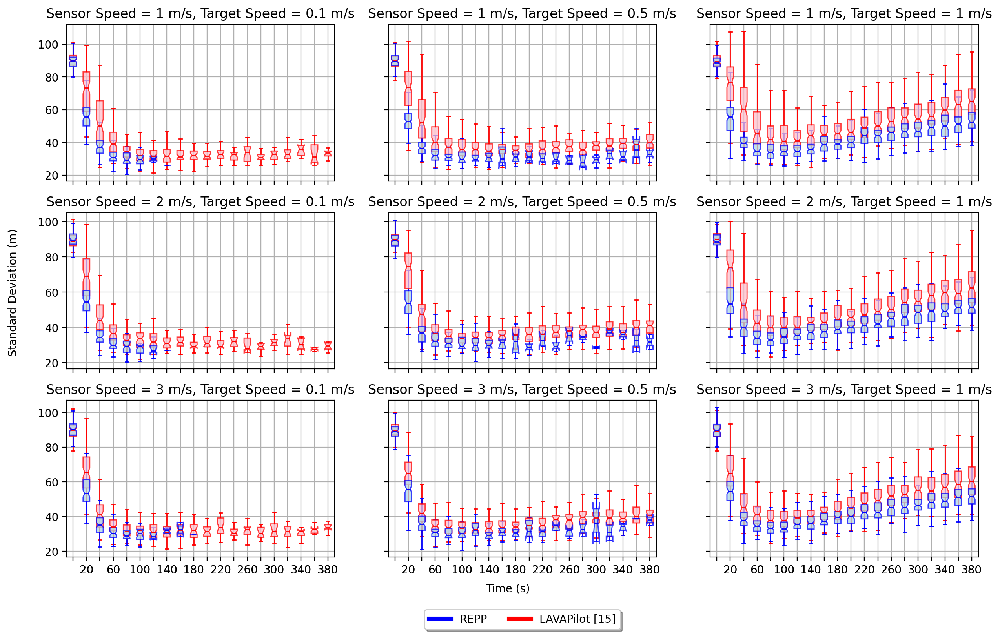

In [64]:
std_dev(get_runs(methods, 4, 5, sensor_speeds, target_speeds))
std_dev(get_runs(methods, 8, 5, sensor_speeds, target_speeds))
std_dev(get_runs(methods, 4, 10, sensor_speeds, target_speeds))
std_dev(get_runs(methods, 8, 10, sensor_speeds, target_speeds))

In [2]:
separable2_experiments_compare_01speed_1sensorspeed = ({
    "lavapilot_0.1speed_1sensorspeed_4target": {},
    "repp_0.1speed_1sensorspeed_4target": {},
    "mcts_separable_0.1speed_1sensorspeed_4target": {},
})
separable2_experiments_compare_01speed_2sensorspeed = ({
    "lavapilot_0.1speed_2sensorspeed_4target": {},
    "repp_0.1speed_2sensorspeed_4target": {},
    "mcts_separable_0.1speed_2sensorspeed_4target": {},
})
separable2_experiments_compare_01speed_3sensorspeed = ({
    "lavapilot_0.1speed_3sensorspeed_4target": {},
    "repp_0.1speed_3sensorspeed_4target": {},
    "mcts_separable_0.1speed_3sensorspeed_4target": {},
})
separable2_experiments_compare_05speed_1sensorspeed = ({
    "lavapilot_0.5speed_1sensorspeed_4target": {},
    "repp_0.5speed_1sensorspeed_4target": {},
    "mcts_separable_0.5speed_1sensorspeed_4target": {},
})
separable2_experiments_compare_05speed_2sensorspeed = ({
    "lavapilot_0.5speed_2sensorspeed_4target": {},
    "repp_0.5speed_2sensorspeed_4target": {},
    "mcts_separable_0.5speed_2sensorspeed_4target": {},
})
separable2_experiments_compare_05speed_3sensorspeed = ({
    "lavapilot_0.5speed_3sensorspeed_4target": {},
    "repp_0.5speed_3sensorspeed_4target": {},
    "mcts_separable_0.5speed_3sensorspeed_4target": {},
})
separable2_experiments_compare_1speed_1sensorspeed = ({
    "lavapilot_1speed_1sensorspeed_4target": {},
    "repp_1speed_1sensorspeed_4target": {},
    "mcts_separable_1speed_1sensorspeed_4target": {},
    
})
separable2_experiments_compare_1speed_2sensorspeed = ({
    "lavapilot_1speed_2sensorspeed_4target": {},
    "repp_1speed_2sensorspeed_4target": {},
    "mcts_separable_1speed_2sensorspeed_4target": {},
})
separable2_experiments_compare_1speed_3sensorspeed = ({
    "lavapilot_1speed_3sensorspeed_4target": {},
    "repp_1speed_3sensorspeed_4target": {},
    "mcts_separable_1speed_3sensorspeed_4target": {},
})
separable2_experiments = ({
    
    "lavapilot_0.1speed_1sensorspeed_4target": {},
    "repp_0.1speed_1sensorspeed_4target": {},
    "mcts_separable_0.1speed_1sensorspeed_4target": {},
    "lavapilot_0.1speed_2sensorspeed_4target": {},
    "repp_0.1speed_2sensorspeed_4target": {},
    "mcts_separable_0.1speed_2sensorspeed_4target": {},
    "lavapilot_0.1speed_3sensorspeed_4target": {},
    "repp_0.1speed_3sensorspeed_4target": {},
    "mcts_separable_0.1speed_3sensorspeed_4target": {},
    "lavapilot_0.5speed_1sensorspeed_4target": {},
    "repp_0.5speed_1sensorspeed_4target": {},
    "mcts_separable_0.5speed_1sensorspeed_4target": {},
    "lavapilot_0.5speed_2sensorspeed_4target": {},
    "repp_0.5speed_2sensorspeed_4target": {},
    "mcts_separable_0.5speed_2sensorspeed_4target": {},
    "lavapilot_0.5speed_3sensorspeed_4target": {},
    "repp_0.5speed_3sensorspeed_4target": {},
    "mcts_separable_0.5speed_3sensorspeed_4target": {},
    "lavapilot_1speed_1sensorspeed_4target": {},
    "repp_1speed_1sensorspeed_4target": {},
    "mcts_separable_1speed_1sensorspeed_4target": {},
    "lavapilot_1speed_2sensorspeed_4target": {},
    "repp_1speed_2sensorspeed_4target": {},
    "mcts_separable_1speed_2sensorspeed_4target": {},
    "lavapilot_1speed_3sensorspeed_4target": {},
    "repp_1speed_3sensorspeed_4target": {},
    "mcts_separable_1speed_3sensorspeed_4target": {},

})

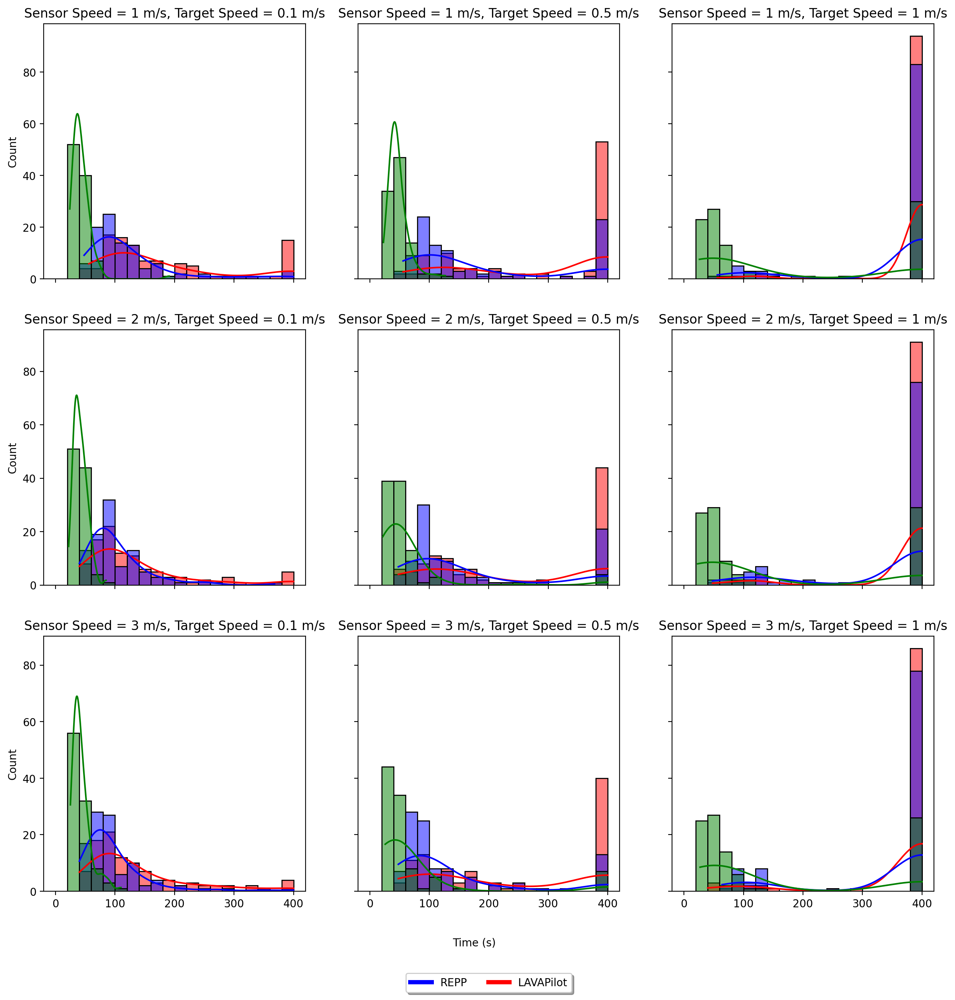

In [3]:
fig, axs = plt.subplots(3, 3, sharey='row', figsize=(15,15), dpi=200)

#fig = plt.figure(figsize=(5,3))
#ax = fig.subplots()
ax = axs[0,0]
facecolors = ["pink","lightblue","lightgreen"]
colors = ["red", "blue", "green"]
i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_01speed_1sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.localization_histogram(ax=ax, color=colors[i])
    i += 1
    labels.append(experiment_name)
    
ax.xaxis.set_ticklabels([])
ax.set_title("Sensor Speed = 1 m/s, Target Speed = 0.1 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
# ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)
#plt.show()

#fig = plt.figure(figsize=(5,3))
#ax = fig.subplots()
ax = axs[0,1]
i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_05speed_1sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.localization_histogram(ax=ax, color=colors[i])
    i += 1
    labels.append(experiment_name)
ax.xaxis.set_ticklabels([])
ax.set_title("Sensor Speed = 1 m/s, Target Speed = 0.5 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
# ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)
#plt.show()

#fig = plt.figure(figsize=(5,3))
#ax = fig.subplots()
ax = axs[0,2]
i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_1speed_1sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.localization_histogram(ax=ax, color=colors[i])
    i += 1
    labels.append(experiment_name)
ax.xaxis.set_ticklabels([])
ax.set_title("Sensor Speed = 1 m/s, Target Speed = 1 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
# ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)
#plt.show()

##################
ax = axs[1,0]

i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_01speed_2sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.localization_histogram(ax=ax, color=colors[i])
    i += 1
    labels.append(experiment_name)
ax.xaxis.set_ticklabels([])
ax.set_title("Sensor Speed = 2 m/s, Target Speed = 0.1 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
# ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)
    
ax = axs[1,1]

i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_05speed_2sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.localization_histogram(ax=ax, color=colors[i])
    i += 1
    labels.append(experiment_name)
ax.xaxis.set_ticklabels([])
ax.set_title("Sensor Speed = 2 m/s, Target Speed = 0.5 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
# ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)
    
ax = axs[1,2]
i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_1speed_2sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.localization_histogram(ax=ax, color=colors[i])
    i += 1
    labels.append(experiment_name)
ax.xaxis.set_ticklabels([])
ax.set_title("Sensor Speed = 2 m/s, Target Speed = 1 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
# ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)

################

ax = axs[2,0]

i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_01speed_3sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.localization_histogram(ax=ax, color=colors[i])
    i += 1
    labels.append(experiment_name)
ax.set_title("Sensor Speed = 3 m/s, Target Speed = 0.1 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)

ax = axs[2,1]

i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_05speed_3sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.localization_histogram(ax=ax, color=colors[i])
    i += 1
    labels.append(experiment_name)
ax.set_title("Sensor Speed = 3 m/s, Target Speed = 0.5 m/s")
custom_lines = [Line2D([0], [0], color="blue", lw=4),
                Line2D([0], [0], color="red", lw=4),
                ]

#ax.legend(custom_lines, labels)
ax.legend(custom_lines, ["REPP","LAVAPilot", "MCTS"],loc='upper center', bbox_to_anchor=(0.5, -0.3),
          fancybox=True, shadow=True, ncol=2)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)

ax = axs[2,2]

i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_1speed_3sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.localization_histogram(ax=ax, color=colors[i])
    i += 1
    labels.append(experiment_name)
ax.set_title("Sensor Speed = 3 m/s, Target Speed = 1 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)
    
    
fig.text(0.5, 0.08, 'Time (s)', ha='center', va='center')
#fig.text(0.08, 0.5, 'Count', ha='center', va='center', rotation='vertical')

plt.show()

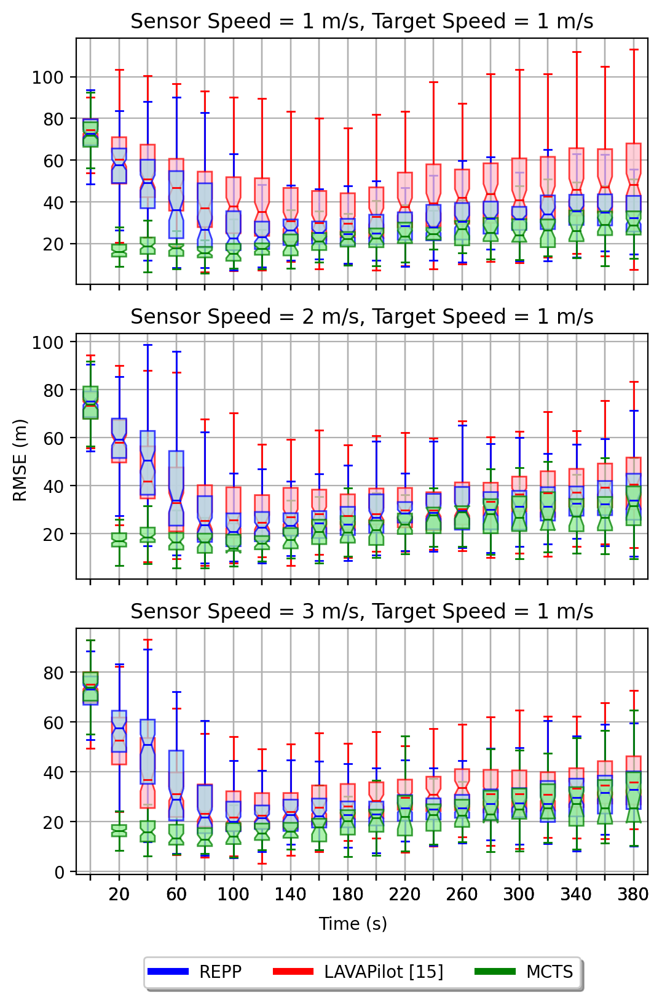

In [57]:
fig, axs = plt.subplots(3, 1, sharey='row', figsize=(6,9), dpi=200)

facecolors = ["pink","lightblue", "lightgreen"]
colors = ["red", "blue", "green"]



ax = axs[0]
i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_1speed_1sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
ax.xaxis.set_ticklabels([])
ax.set_title("Sensor Speed = 1 m/s, Target Speed = 1 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
# ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)
#plt.show()

##################

ax = axs[1]
i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_1speed_2sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
ax.xaxis.set_ticklabels([])
ax.set_title("Sensor Speed = 2 m/s, Target Speed = 1 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
# ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)

################


ax = axs[2]

i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_1speed_3sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
ax.set_title("Sensor Speed = 3 m/s, Target Speed = 1 m/s")
custom_lines = [Line2D([0], [0], color="blue", lw=4),
                Line2D([0], [0], color="red", lw=4),
                Line2D([0], [0], color="green", lw=4)
                ]

#ax.legend(custom_lines, labels)
ax.legend(custom_lines, ["REPP","LAVAPilot [15]", "MCTS"],loc='upper center', bbox_to_anchor=(0.5, -0.3),
          fancybox=True, shadow=True, ncol=3)
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
ax.tick_params(axis='x',labelsize=10)
for label in ax.get_xticklabels()[::2]:
    label.set_visible(False)
    
    
fig.text(0.5, 0.08, 'Time (s)', ha='center', va='center')
fig.text(0.05, 0.5, 'RMSE (m)', ha='center', va='center', rotation='vertical')

plt.show()

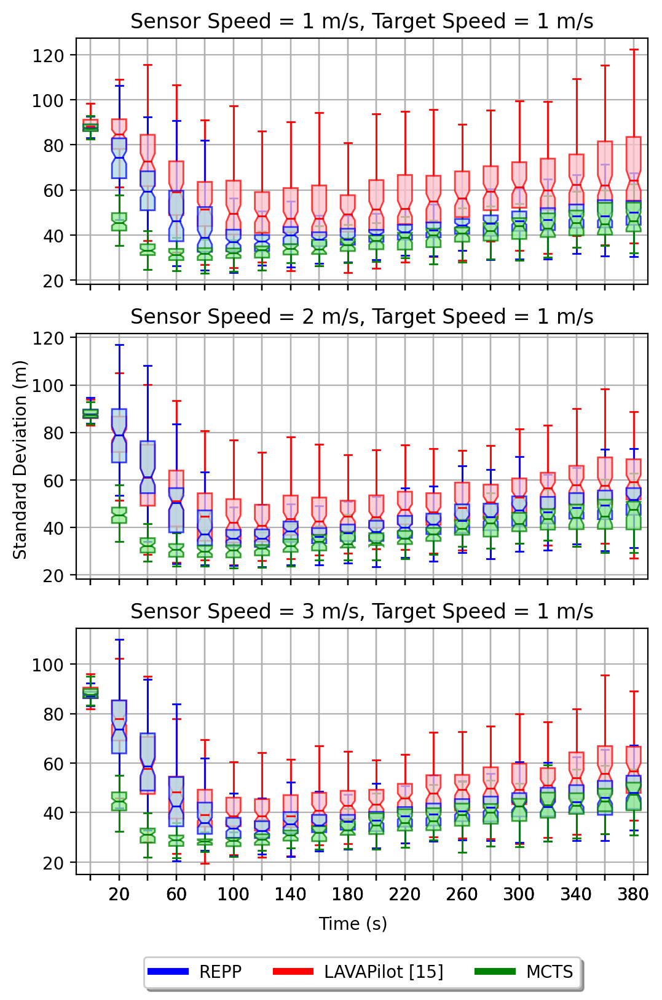

In [58]:
fig, axs = plt.subplots(3, 1, sharey='row', figsize=(6,9), dpi=200)


ax = axs[0]
i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_1speed_1sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
ax.xaxis.set_ticklabels([])
ax.set_title("Sensor Speed = 1 m/s, Target Speed = 1 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
# ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)
#plt.show()

##################
    
ax = axs[1]
i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_1speed_2sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
ax.xaxis.set_ticklabels([])
ax.set_title("Sensor Speed = 2 m/s, Target Speed = 1 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
# ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)

################

ax = axs[2]

i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_1speed_3sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
ax.set_title("Sensor Speed = 3 m/s, Target Speed = 1 m/s")
custom_lines = [Line2D([0], [0], color="blue", lw=4),
                Line2D([0], [0], color="red", lw=4),
                Line2D([0], [0], color="green", lw=4),
                ]

#ax.legend(custom_lines, labels)
ax.legend(custom_lines, ["REPP","LAVAPilot [15]", "MCTS"],loc='upper center', bbox_to_anchor=(0.5, -0.3),
          fancybox=True, shadow=True, ncol=3)
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
ax.tick_params(axis='x',labelsize=10)
for label in ax.get_xticklabels()[::2]:
    label.set_visible(False)
    
    
fig.text(0.5, 0.08, 'Time (s)', ha='center', va='center')
fig.text(0.05, 0.5, 'Standard Deviation (m)', ha='center', va='center', rotation='vertical')
plt.show()

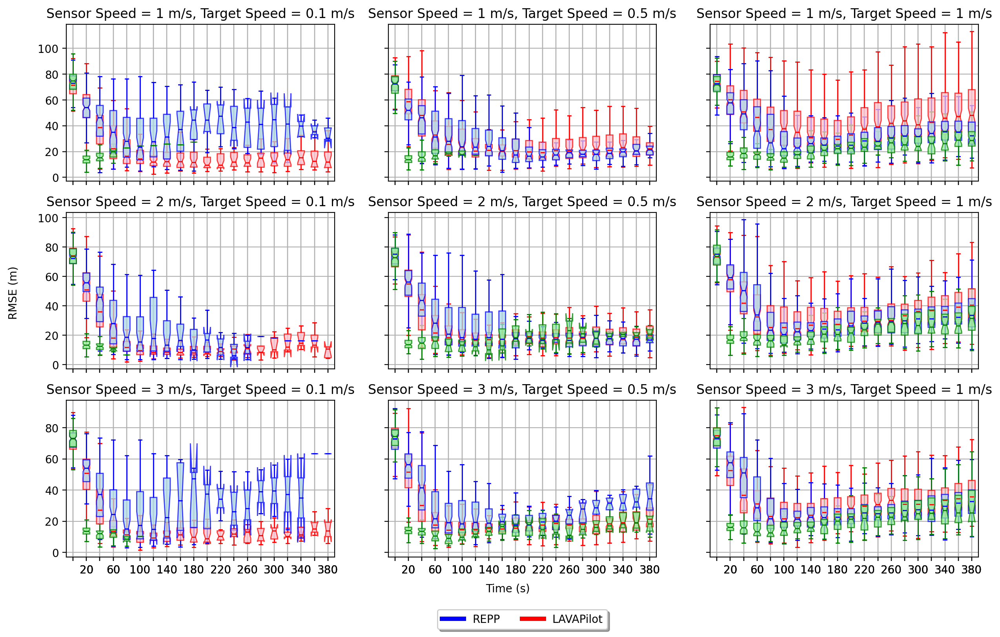

In [4]:
fig, axs = plt.subplots(3, 3, sharey='row', figsize=(15,9), dpi=200)

#fig = plt.figure(figsize=(5,3))
#ax = fig.subplots()
ax = axs[0,0]
facecolors = ["pink","lightblue", "lightgreen"]
colors = ["red", "blue", "green"]
i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_01speed_1sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
    
ax.xaxis.set_ticklabels([])
ax.set_title("Sensor Speed = 1 m/s, Target Speed = 0.1 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
# ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)
#plt.show()

#fig = plt.figure(figsize=(5,3))
#ax = fig.subplots()
ax = axs[0,1]
i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_05speed_1sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
ax.xaxis.set_ticklabels([])
ax.set_title("Sensor Speed = 1 m/s, Target Speed = 0.5 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
# ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)
#plt.show()

#fig = plt.figure(figsize=(5,3))
#ax = fig.subplots()
ax = axs[0,2]
i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_1speed_1sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
ax.xaxis.set_ticklabels([])
ax.set_title("Sensor Speed = 1 m/s, Target Speed = 1 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
# ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)
#plt.show()

##################
ax = axs[1,0]

i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_01speed_2sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
ax.xaxis.set_ticklabels([])
ax.set_title("Sensor Speed = 2 m/s, Target Speed = 0.1 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
# ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)
    
ax = axs[1,1]

i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_05speed_2sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
ax.xaxis.set_ticklabels([])
ax.set_title("Sensor Speed = 2 m/s, Target Speed = 0.5 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
# ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)
    
ax = axs[1,2]
i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_1speed_2sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
ax.xaxis.set_ticklabels([])
ax.set_title("Sensor Speed = 2 m/s, Target Speed = 1 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
# ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)

################

ax = axs[2,0]

i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_01speed_3sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
ax.set_title("Sensor Speed = 3 m/s, Target Speed = 0.1 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
ax.tick_params(axis='x',labelsize=10)
for label in ax.get_xticklabels()[::2]:
    label.set_visible(False)

ax = axs[2,1]

i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_05speed_3sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
ax.set_title("Sensor Speed = 3 m/s, Target Speed = 0.5 m/s")
custom_lines = [Line2D([0], [0], color="blue", lw=4),
                Line2D([0], [0], color="red", lw=4),
                ]

#ax.legend(custom_lines, labels)
ax.legend(custom_lines, ["REPP","LAVAPilot", "MCTS"],loc='upper center', bbox_to_anchor=(0.5, -0.3),
          fancybox=True, shadow=True, ncol=2)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
ax.tick_params(axis='x',labelsize=10)
for label in ax.get_xticklabels()[::2]:
    label.set_visible(False)

ax = axs[2,2]

i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_1speed_3sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.rmse_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
ax.set_title("Sensor Speed = 3 m/s, Target Speed = 1 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
ax.tick_params(axis='x',labelsize=10)
for label in ax.get_xticklabels()[::2]:
    label.set_visible(False)
    
    
fig.text(0.5, 0.08, 'Time (s)', ha='center', va='center')
fig.text(0.08, 0.5, 'RMSE (m)', ha='center', va='center', rotation='vertical')

plt.show()

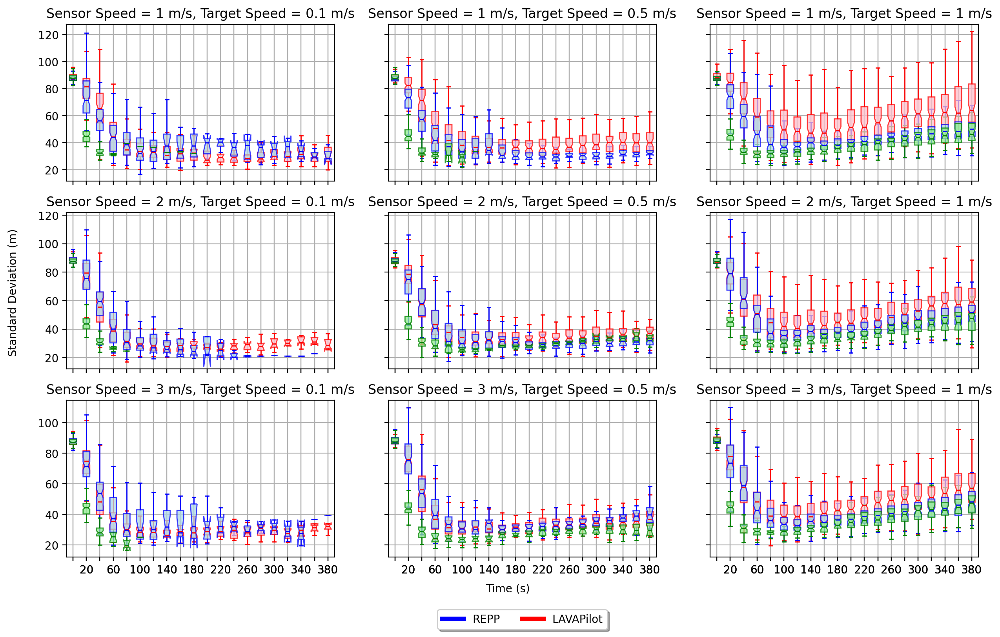

In [5]:
fig, axs = plt.subplots(3, 3, sharey='row', figsize=(15,9), dpi=200)

#fig = plt.figure(figsize=(5,3))
#ax = fig.subplots()
ax = axs[0,0]
facecolors = ["pink","lightblue", "lightgreen"]
colors = ["red", "blue", "green"]
i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_01speed_1sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
    
ax.xaxis.set_ticklabels([])
ax.set_title("Sensor Speed = 1 m/s, Target Speed = 0.1 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
# ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)
#plt.show()

#fig = plt.figure(figsize=(5,3))
#ax = fig.subplots()
ax = axs[0,1]
i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_05speed_1sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
ax.xaxis.set_ticklabels([])
ax.set_title("Sensor Speed = 1 m/s, Target Speed = 0.5 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
# ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)
#plt.show()

#fig = plt.figure(figsize=(5,3))
#ax = fig.subplots()
ax = axs[0,2]
i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_1speed_1sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
ax.xaxis.set_ticklabels([])
ax.set_title("Sensor Speed = 1 m/s, Target Speed = 1 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
# ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)
#plt.show()

##################
ax = axs[1,0]

i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_01speed_2sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
ax.xaxis.set_ticklabels([])
ax.set_title("Sensor Speed = 2 m/s, Target Speed = 0.1 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
# ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)
    
ax = axs[1,1]

i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_05speed_2sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
ax.xaxis.set_ticklabels([])
ax.set_title("Sensor Speed = 2 m/s, Target Speed = 0.5 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
# ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)
    
ax = axs[1,2]
i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_1speed_2sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
ax.xaxis.set_ticklabels([])
ax.set_title("Sensor Speed = 2 m/s, Target Speed = 1 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
# ax.tick_params(axis='x',labelsize=10)
# for label in ax.get_xticklabels()[::2]:
#     label.set_visible(False)

################

ax = axs[2,0]

i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_01speed_3sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
ax.set_title("Sensor Speed = 3 m/s, Target Speed = 0.1 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
ax.tick_params(axis='x',labelsize=10)
for label in ax.get_xticklabels()[::2]:
    label.set_visible(False)

ax = axs[2,1]

i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_05speed_3sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
ax.set_title("Sensor Speed = 3 m/s, Target Speed = 0.5 m/s")
custom_lines = [Line2D([0], [0], color="blue", lw=4),
                Line2D([0], [0], color="red", lw=4),
                ]

#ax.legend(custom_lines, labels)
ax.legend(custom_lines, ["REPP","LAVAPilot", "MCTS"],loc='upper center', bbox_to_anchor=(0.5, -0.3),
          fancybox=True, shadow=True, ncol=2)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
ax.tick_params(axis='x',labelsize=10)
for label in ax.get_xticklabels()[::2]:
    label.set_visible(False)

ax = axs[2,2]

i = 0
labels = []
for experiment_name, experiment_config in separable2_experiments_compare_1speed_3sensorspeed.items():
    reader = birdseye.utils.ResultsReader(experiment_name)
    reader.std_dev_plot(ax=ax, color=colors[i], facecolor=facecolors[i])
    i += 1
    labels.append(experiment_name)
ax.set_title("Sensor Speed = 3 m/s, Target Speed = 1 m/s")
# custom_lines = [Line2D([0], [0], color="blue", lw=4),
#                 Line2D([0], [0], color="red", lw=4),
#                 ]

# ax.legend(custom_lines, labels)
# ax.set_xlabel("Time")
# ax.set_ylabel("RMSE")
ax.tick_params(axis='x',labelsize=10)
for label in ax.get_xticklabels()[::2]:
    label.set_visible(False)
    
    
fig.text(0.5, 0.08, 'Time (s)', ha='center', va='center')
fig.text(0.08, 0.5, 'Standard Deviation (m)', ha='center', va='center', rotation='vertical')
plt.show()

In [6]:
for experiment_name, experiment_config in separable2_experiments.items():
    
    reader = birdseye.utils.ResultsReader(experiment_name)
    
    print("======================================================================")
    print(f"{experiment_name=}")
    print(f"Probability of successful localization of all targets = {reader.localization_probability()}")
    print(f"Average runtime of successful runs = {reader.average_localization_time()}")
    print(f"Average rmse of successful runs = {reader.average_rmse()[0]}")
    print(f"Average rmse of all runs = {reader.average_rmse()[1]}")
    print(f"Average standard deviation of successful runs = {reader.average_std_dev()[0]}")
    print(f"Average standard deviation of all runs = {reader.average_std_dev()[1]}")
    print("======================================================================")

experiment_name='lavapilot_0.1speed_1sensorspeed_4target'
Probability of successful localization of all targets = 0.86
Average runtime of successful runs = 142.7906976744186
Average rmse of successful runs = 9.29838662180123
Average rmse of all runs = 10.675808818729319
Average standard deviation of successful runs = 25.237799302161463
Average standard deviation of all runs = 26.451364709814662
experiment_name='repp_0.1speed_1sensorspeed_4target'
Probability of successful localization of all targets = 0.98
Average runtime of successful runs = 116.73469387755102
Average rmse of successful runs = 11.113128456033513
Average rmse of all runs = 11.631399853680893
Average standard deviation of successful runs = 26.067872252667616
Average standard deviation of all runs = 26.202496156078038
experiment_name='mcts_separable_0.1speed_1sensorspeed_4target'
Probability of successful localization of all targets = 1.0
Average runtime of successful runs = 43.2
Average rmse of successful runs = 13.8671

experiment_name='repp_0.5speed_3sensorspeed_4target'
Probability of successful localization of all targets = 0.87
Average runtime of successful runs = 99.49425287356321
Average rmse of successful runs = 12.78944792756245
Average rmse of all runs = 15.525545904996228
Average standard deviation of successful runs = 26.27506403947189
Average standard deviation of all runs = 28.222727648343483
experiment_name='mcts_separable_0.5speed_3sensorspeed_4target'
Probability of successful localization of all targets = 0.93
Average runtime of successful runs = 46.72043010752688
Average rmse of successful runs = 12.7425759370546
Average rmse of all runs = 13.170183400248957
Average standard deviation of successful runs = 26.193480452607748
Average standard deviation of all runs = 26.47185013935346
experiment_name='lavapilot_1speed_1sensorspeed_4target'
Probability of successful localization of all targets = 0.06
Average runtime of successful runs = 133.33333333333334
Average rmse of successful runs 